In [2]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

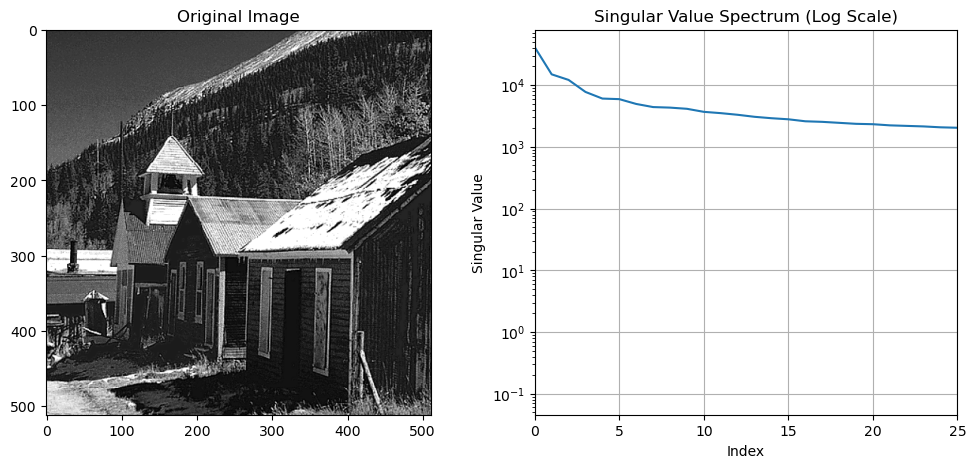

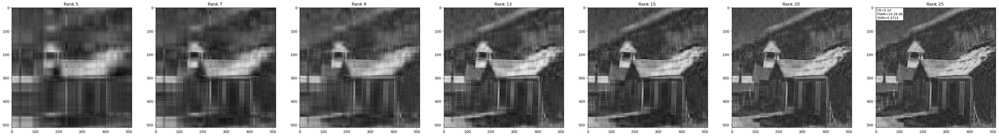

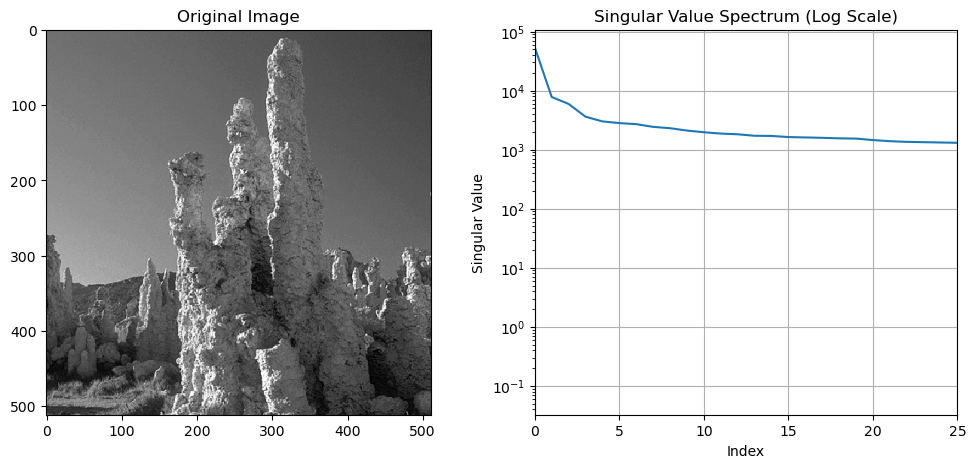

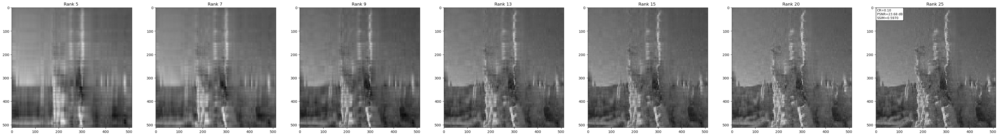

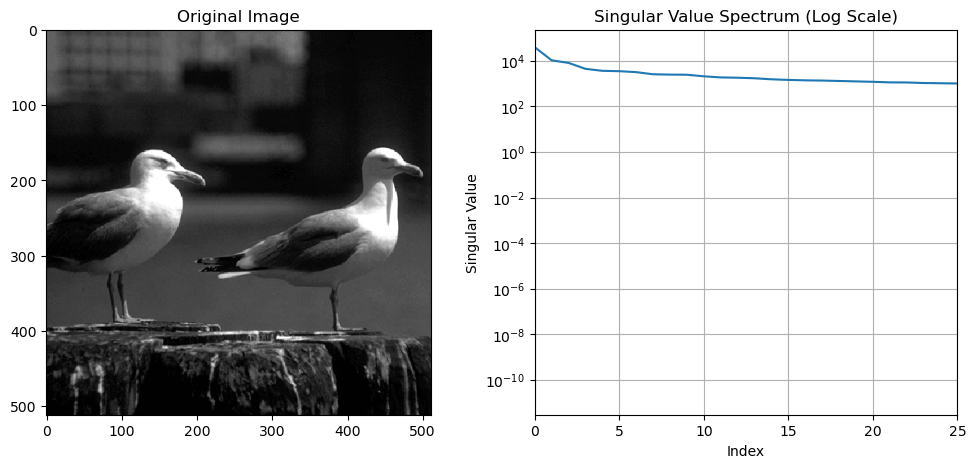

...

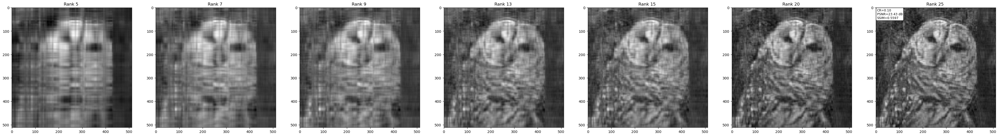

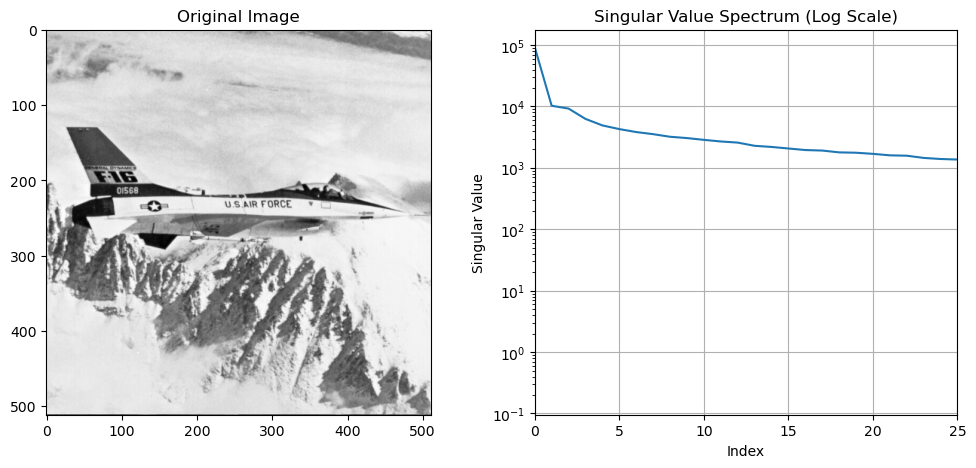

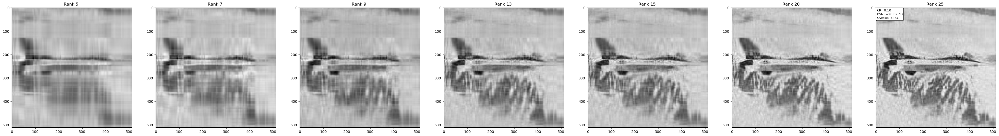

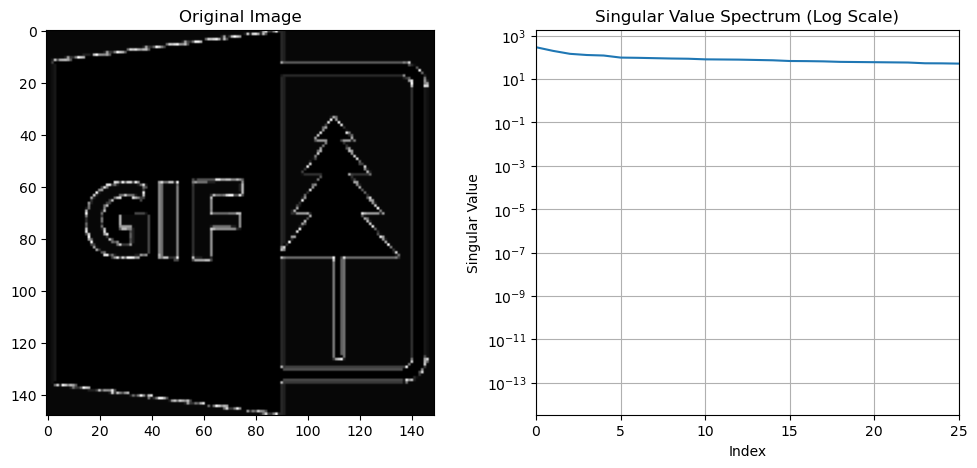

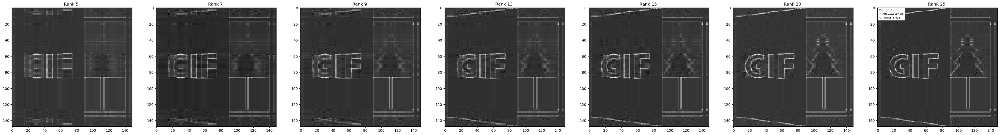

In [6]:
for i in range(1,13):
    
    img = Image.open(f"512x512-{i}.gif")
    
    A=np.array(img, dtype=np.float64)
    #print(A)
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    axs[0].imshow(A,cmap='gray')
    axs[0].set_title("Original Image")

    U, S, V_T = np.linalg.svd(A,full_matrices=False)

    #print(S)

    axs[1].plot(S)
    axs[1].set_yscale("log")
    axs[1].set_title("Singular Value Spectrum (Log Scale)")
    axs[1].set_xlabel("Index")
    axs[1].set_ylabel("Singular Value")
    axs[1].set_xlim(0, 25) 
    axs[1].grid(True)
    
    plt.show()

    m, n = A.shape
    original_size = m * n

    fig, axs = plt.subplots(1, 7, figsize=(50, 10))
    ranks = [5, 7, 9, 13, 15, 20, 25]
    for i, r in enumerate(ranks):
    
        # Truncate the SVD to rank r
        Ur = U[:, :r] #m*r
        Sr = np.diag(S[:r]) #r
        V_Tr = V_T[:r, :] #r*n
    
        # Reconstructing A as A_r :the original data matrix but now truncated to r rows
        A_r = Ur @ Sr @ V_Tr
    
        compressed_size = r * (m + n + 1)
        cr =  compressed_size*1.0 /original_size 
        
        psnr_val = psnr(A, A_r, data_range=255) #30-40dB decent
        ssim_val = ssim(A, A_r, data_range=255) #closer to 1 for better structural similarity
        
        
        axs[i].imshow(A_r, cmap='gray')
        axs[i].set_title(f"Rank {r} ")
        axs[i].text(0.01, 0.99, 
             f"CR={cr:.2f}\nPSNR={psnr_val:.2f} dB\nSSIM={ssim_val:.4f}", 
             transform=plt.gca().transAxes,
             fontsize=9,
             verticalalignment='top',
             horizontalalignment='left',
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))
        #plt.axis('off')
    plt.show()
    
    
